## CNNRNN model + MSE loss to reconstruct the operation label series

In [1]:
import torch.nn as nn
import numpy as np
import os
import gc
import pickle
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset
from sklearn.manifold import TSNE
import seaborn as sns
import random

In [129]:
def create_multi_bars(labels, cls, datas, std_err, tick_step=1, group_gap=0.2, bar_gap=0):
    '''
    labels : x轴坐标标签序列
    lcs: 每条bar的label
    datas ：数据集，二维列表，要求列表每个元素的长度必须与labels的长度一致
    tick_step ：默认x轴刻度步长为1，通过tick_step可调整x轴刻度步长。
    group_gap : 柱子组与组之间的间隙，最好为正值，否则组与组之间重叠
    bar_gap ：每组柱子之间的空隙，默认为0，每组柱子紧挨，正值每组柱子之间有间隙，负值每组柱子之间重叠
    '''
    # x为每组柱子x轴的基准位置
    x = np.arange(len(labels)) * tick_step
    # group_num为数据的组数，即每组柱子的柱子个数
    group_num = len(datas)
    # group_width为每组柱子的总宽度，group_gap 为柱子组与组之间的间隙。
    group_width = tick_step - group_gap
    # bar_span为每组柱子之间在x轴上的距离，即柱子宽度和间隙的总和
    bar_span = group_width / group_num
    # bar_width为每个柱子的实际宽度
    bar_width = bar_span - bar_gap
    # 绘制柱子
    error_params = dict(elinewidth=0.5,ecolor='black',capsize=1.8)
    for index, v in enumerate(zip(datas,std_err,cls)):
        y, se, l = v
        plt.bar(x + index*bar_span, y, bar_width,yerr=se,error_kw=error_params, label=l)
    plt.ylabel('F1-measure', fontproperties='Times New Roman', size=13,weight='bold')
    plt.xlabel('Worker', fontproperties='Times New Roman', size=13,weight='bold')
    plt.legend()
    # plt.title('multi datasets')
    # ticks为新x轴刻度标签位置，即每组柱子x轴上的中心位置
    ticks = x + (group_width - bar_span) / 2
    plt.xticks(ticks, labels)
    plt.grid(axis='y',ls='-.')
    # plt.show()



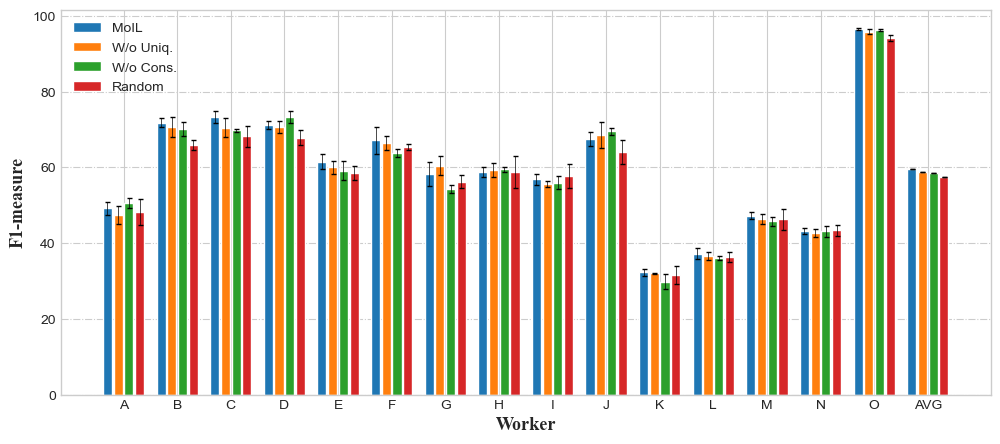

In [130]:

worker = ['A', 'B', 'C', 'D', 'E','F', 'G', 'H', 'I', 'J', 'K','L','M','N','O','AVG']
label = ['MoIL', 'W/o Uniq.','W/o Cons.','Random']
MoIL = [49.19,71.86,73.28,71.19,61.54,67.13,58.29,58.81,56.86,67.53,32.32,37.24,47.22,43.14,96.60,59.48]
wos2 = [47.42,70.75,70.55,70.70,60.05,66.43,60.51,59.40,55.69,68.56,32.00,36.69,46.43,42.67,95.88,58.92]
wos1 = [50.58,70.05,69.77,73.23,59.13,63.92,54.31,59.55,55.96,69.52,29.87,36.05,45.82,43.11,96.28,58.48]
rand = [48.24,66.02,68.20,67.86,58.62,65.38,56.27,58.91,57.77,64.05,31.68,36.29,46.29,43.43,94.28,57.55]
std_err1 = [1.736743885,1.19819842,1.610234855,0.986452241,2.027673743,3.535177148,3.109850867,1.386980459,1.445770982,1.917448999,0.987867612,1.440384849,0.918828587,0.847208657,0.267599264,0]
std_err2 = [2.286416784,2.69292486,2.557977738,1.687763523,1.736086233,1.9372762,2.388865546,1.865854729,0.819885376,3.327939263,0.192981587,1.035180106,1.25474649,1.037057067,0.604619607,0]
std_err3 = [1.273443688,1.831526578,0.37055405,1.578589287,2.504832598,1.081279397,1.014327525,0.676260266,1.670471315,0.87266446,1.858624007,0.570434309,1.21669788,1.431508166,0.232512005,0]
std_err4 = [3.447133596,1.365536212,2.793058688,1.963055284,1.82593931,0.80438914,1.617591411,4.207598589,3.084640657,3.128956202,2.387554801,1.34692232,2.844752899,1.443799635,0.755719977,0]

data = [MoIL, wos2, wos1, rand]
stdarray=[std_err1,std_err2,std_err3,std_err4]
plt.figure(figsize=(12,5))
create_multi_bars(worker, label, data, stdarray, bar_gap=0.03)
plt.savefig('ablation.pdf', dpi=600,format='pdf',bbox_inches='tight',pad_inches=0.0)

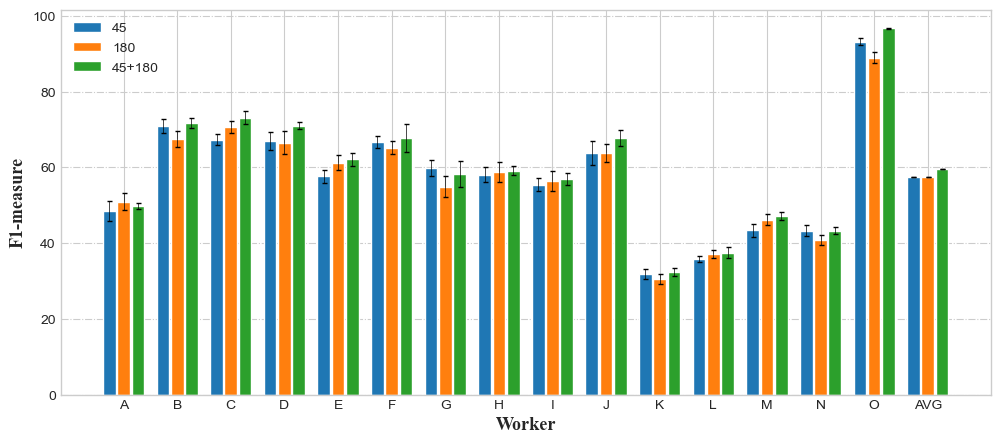

In [131]:

worker = ['A', 'B', 'C', 'D', 'E','F', 'G', 'H', 'I', 'J', 'K','L','M','N','O','AVG']
label = ['45', '180','45+180']
MoIL = [48.55,71.03,67.36,66.95,57.63,66.70,59.79,58.12,55.45,63.76,31.79,35.82,43.36,43.29,93.16,57.52]
wos2 = [50.97,67.44,70.69,66.55,61.22,65.22,54.91,58.66,56.42,63.90,30.60,37.16,46.20,40.85,89,57.37]
wos1 = [49.82,71.80,73.07,71.02,62.12,67.67,58.20,59.16,57.00,67.69,32.37,37.46,47.25,43.21,96.70,59.64]
std_err1 = [2.574379237,1.825173974,1.51181769,2.446672493,1.739285151,1.645344451,2.148100878,2.021392118,1.763044992,3.087909978,1.258003508,0.808133073,1.669167751,1.494315116,0.955208459,0]
std_err2 = [2.237190173,2.150949635,1.68866846,3.082585207,1.983087505,1.680731705,2.768194661,2.639778204,2.600729615,2.406321922,1.319838148,1.113803916,1.51462824,1.406422769,1.524542855,0]
std_err3 = [0.866662315,1.329276206,1.712095031,0.988753783,1.619322209,3.671094553,3.468726005,1.22563556,1.571491125,2.096908201,1.097207745,1.498319364,1.022847808,0.928574097,0.143814695,0]


data = [MoIL, wos2, wos1]
stdarray=[std_err1,std_err2,std_err3,std_err4]
plt.figure(figsize=(12,5))
create_multi_bars(worker, label, data, stdarray, bar_gap=0.03)
plt.savefig('window.pdf', dpi=600,format='pdf',bbox_inches='tight',pad_inches=0.0)

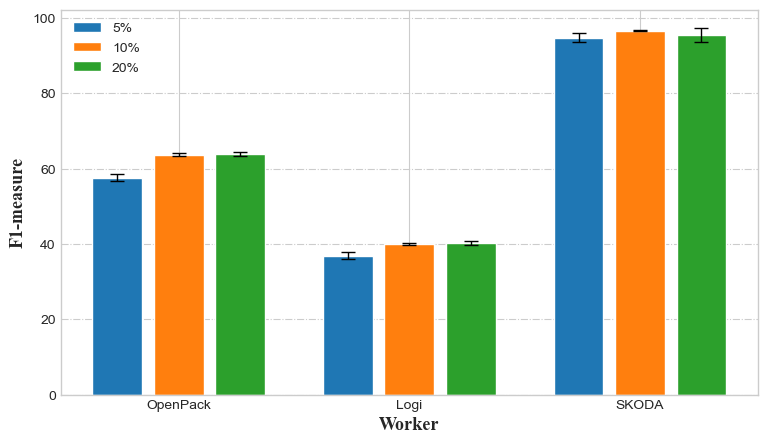

In [132]:
def create_multi_bars_small(labels, cls, datas, std_err, tick_step=1, group_gap=0.2, bar_gap=0):
    '''
    labels : x轴坐标标签序列
    lcs: 每条bar的label
    datas ：数据集，二维列表，要求列表每个元素的长度必须与labels的长度一致
    tick_step ：默认x轴刻度步长为1，通过tick_step可调整x轴刻度步长。
    group_gap : 柱子组与组之间的间隙，最好为正值，否则组与组之间重叠
    bar_gap ：每组柱子之间的空隙，默认为0，每组柱子紧挨，正值每组柱子之间有间隙，负值每组柱子之间重叠
    '''
    # x为每组柱子x轴的基准位置
    x = np.arange(len(labels)) * tick_step
    # group_num为数据的组数，即每组柱子的柱子个数
    group_num = len(datas)
    # group_width为每组柱子的总宽度，group_gap 为柱子组与组之间的间隙。
    group_width = tick_step - group_gap
    # bar_span为每组柱子之间在x轴上的距离，即柱子宽度和间隙的总和
    bar_span = group_width / group_num
    # bar_width为每个柱子的实际宽度
    bar_width = bar_span - bar_gap
    # 绘制柱子
    error_params = dict(elinewidth=1,ecolor='black',capsize=5)
    for index, v in enumerate(zip(datas,std_err,cls)):
        y, se, l = v
        plt.bar(x + index*bar_span, y, bar_width,yerr=se,error_kw=error_params, label=l)
    plt.ylabel('F1-measure', fontproperties='Times New Roman', size=13,weight='bold')
    plt.xlabel('Worker', fontproperties='Times New Roman', size=13,weight='bold')
    plt.legend()
    # plt.title('multi datasets')
    # ticks为新x轴刻度标签位置，即每组柱子x轴上的中心位置
    ticks = x + (group_width - bar_span) / 2
    plt.xticks(ticks, labels)
    plt.grid(axis='y',ls='-.')
    # plt.show()


worker = ['OpenPack', 'Logi', 'SKODA']
label = ['5%', '10%','20%']

mask5 = [57.64,36.91,94.77]
prop10 = [63.76,40.07,96.70]
mask20 = [63.88,40.30,95.50]

std_err1 = [0.83,0.88,1.18]
std_err2 = [0.36,0.32,0.14]
std_err3 = [0.58,0.47,1.90]

data = [mask5, prop10, mask20]
stdarray=[std_err1,std_err2,std_err3]
plt.figure(figsize=(9,5))
create_multi_bars_small(worker, label, data, stdarray,group_gap=0.2, bar_gap=0.05)
plt.savefig('masklen.jpg', dpi=600,format='jpg',bbox_inches='tight',pad_inches=0.0)

KeyboardInterrupt: 

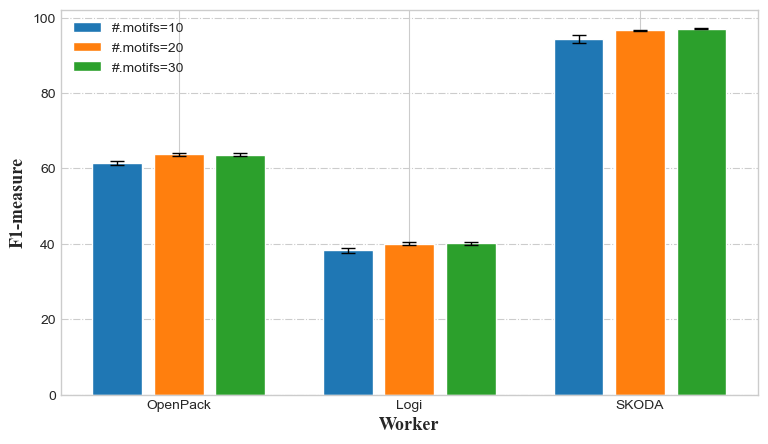

In [133]:
worker = ['OpenPack', 'Logi', 'SKODA']
label = ['#.motifs=10', '#.motifs=20','#.motifs=30']

mask5 = [61.42,38.25,94.26]
prop10 = [63.76,40.07,96.70]
mask20 = [63.70,40.10,97.09]

std_err1 = [0.50,0.68,1.02]
std_err2 = [0.36,0.32,0.14]
std_err3 = [0.27,0.39,0.20]

data = [mask5, prop10, mask20]
stdarray=[std_err1,std_err2,std_err3]
plt.figure(figsize=(9,5))
create_multi_bars_small(worker, label, data, stdarray,group_gap=0.2, bar_gap=0.05)
plt.savefig('numbermotif.jpg', dpi=600,format='jpg',bbox_inches='tight',pad_inches=0.0)

#### 折线图

In [ ]:

from matplotlib import pyplot
plt.style.use('seaborn-whitegrid')
palette = pyplot.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 18,
}

fig=plt.figure(figsize=(20,10))
iters=list(range(7))
#这里随机给了alldata1和alldata2数据用于测试
alldata1=[]#算法1所有纵坐标数据
data=np.array([2.8,4.7,5.7,8.7,11,13,15])#单个数据
alldata1.append(data)
data=np.array([2,3,6,12,13,13,15])
alldata1.append(data)
data=np.array([2,2,7,9,13,14,16])
alldata1.append(data)
alldata1=np.array(alldata1)
alldata2=[]#算法2所有纵坐标数据
data=np.array([2.7,4.7,5.7,8.7,10.7,10.7,11.7])#单个数据
alldata2.append(data)
data=np.array([3,3,3,6,7,8,10])
alldata2.append(data)
data=np.array([3,3,5,5,6,7,9])
alldata2.append(data)
alldata2=np.array(alldata2)

for i in range(2):
    color=palette(0)#算法1颜色
    ax=fig.add_subplot(1,2,i+1)
    avg=np.mean(alldata1,axis=0)
    std=np.std(alldata1,axis=0)
    # print(avg)
    # print(std)
    r1 = list(map(lambda x: x[0]-x[1], zip(avg, std)))#上方差
    r2 = list(map(lambda x: x[0]+x[1], zip(avg, std)))#下方差
    ax.plot(iters, avg, color=color,label="algo1",linewidth=3.0)
    ax.fill_between(iters, r1, r2, color=color, alpha=0.2)

    # color=palette(1)
    # avg=np.mean(alldata2,axis=0)
    # std=np.std(alldata2,axis=0)
    # r1 = list(map(lambda x: x[0]-x[1], zip(avg, std)))
    # r2 = list(map(lambda x: x[0]+x[1], zip(avg, std)))
    # ax.plot(iters, avg, color=color,label="algo2",linewidth=3.0)
    # ax.fill_between(iters, r1, r2, color=color, alpha=0.2)
    #
    # ax.legend(loc='lower right',prop=font1)
    # ax.set_xlabel('Outer loop iterations',fontsize=22)
    # ax.set_ylabel('Objectives',fontsize=22)


In [ ]:
avg

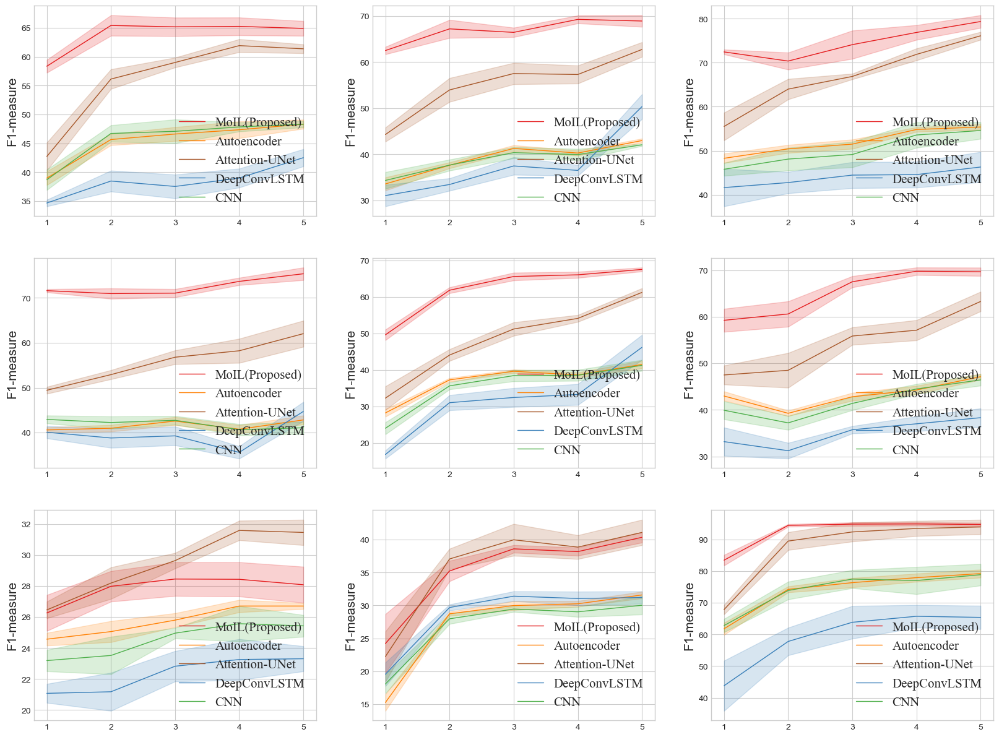

In [57]:
from matplotlib import pyplot
plt.style.use('seaborn-whitegrid')
palette = pyplot.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 15,
}

MoILlist = [
[58.33786808,65.39951206,65.16322666,65.2413772,64.89050463],
[62.48579329,67.17560238,66.41822404,69.22930625,68.87887152],
[72.47393214,70.39211305,74.12510264,76.89924472,79.3859642],
[71.60271192,70.95642288,71.0538798,73.66776322,75.36320187],
[49.59467454,61.80981995,65.56370349,66.03109682,67.5017339],
[59.23922896,60.59803917,67.51835552,69.7763828,69.66414112],
[26.26391341,27.98256382,28.45196908,28.4347157,28.08441032],
[24.2290118,35.24099849,38.6051994,38.185864,40.35811376],
[83.43290548,94.42091337,94.8168876,94.87849481,94.70216666]
]
MoILstd = [
    [1.1111329,1.77577032,1.601660105,1.541273699,1.280112876],
[0.809020013,1.956804265,1.017474713,0.851743908,1.254762181],
[0.541848454,1.931832956,3.212235129,1.674370143,1.438567719],
[0.353824039,1.154141766,0.911123659,0.815638279,1.403712064],
[1.454285714,0.813313747,1.058010098,0.835221375,0.539729454],
[2.47233474,2.725765996,1.205923855,0.808835057,0.893518222],
[1.160308,0.98532968,1.08867321,1.105121282,1.164833197],
[4.476408844,1.553899581,0.575774741,0.618342584,0.792376647],
[1.671044261,0.406170433,0.553685575,0.527047057,0.544911337]
]

convlstmlist = [
    [34.65435677,38.46185977,37.5244282,38.97622628,42.50545416],
[31.069758,33.4661682,37.48312548,36.51870572,50.33239306],
[41.6026361,42.7446164,44.44444094,44.55837494,46.28304057],
[40.08993681,38.80965716,39.27911386,35.59552478,44.72162144],
[16.81196549,30.99860632,32.4255488,33.24771,46.1589575],
[33.18253955,31.23447233,35.7354078,37.00976206,38.32272523],
[21.07603584,21.17702472,22.82583832,23.25784262,23.30837075],
[19.5642474,29.69589569,31.41570166,31.06757476,31.21063517],
[43.79556924,57.77647027,63.8275551,65.72176927,65.37528812]
]
convlstmstd = [
    [0.57,1.81,2.05,1.64,1.49 ],
[2.33,1.35,1.91,1.16,2.69 ],
[4.26,2.43,2.96,2.95,3.43 ],
[1.35,2.18,2.08,1.37,2.13 ],
[1.12,2.08,2.59,2.86,3.42 ],
[3.04,1.69,0.79,1.58,2.00 ],
[0.61,1.23,0.98,1.32,0.81 ],
[1.80,0.47,0.74,1.04,0.94 ],
[7.92,4.36,5.16,3.57,3.69]
]

cnnlist = [
    [38.68,46.70,47.07,47.83,48.30 ],
[34.35,37.67,40.36,39.95,42.06 ],
[45.77,48.09,49.13,53.57,54.59 ],
[42.94,42.25,42.74,40.66,41.08 ],
[24.00,35.61,38.41,38.51,41.23 ],
[39.92,37.21,41.39,44.49,46.44 ],
[23.19,23.52,24.96,25.57,25.43 ],
[18.08,27.98,29.46,29.04,30.03 ],
[62.80,73.86,77.47,77.01,78.85 ]
]
cnnstd = [
    [1.77,1.43,2.06,0.78,0.54 ],
[1.81,1.20,1.22,1.23,0.25 ],
[1.48,2.58,2.91,2.90,1.89 ],
[0.88,1.36,0.97,1.25,1.38 ],
[1.65,0.95,1.55,1.52,1.50 ],
[1.94,1.49,1.44,1.07,1.23 ],
[0.69,1.21,0.34,1.14,0.70 ],
[1.40,0.78,0.42,0.77,1.39 ],
[2.11,2.80,2.86,4.29,3.40 ]
]

lstmlist = [
[17.40,16.63,16.14,16.16,19.39 ],
[15.45,13.72,13.39,15.30,23.12 ],
[12.81,20.55,19.85,18.03,21.16 ],
[13.20,9.95,10.44,13.14,15.85 ],
[3.12,11.61,11.85,13.83,21.45 ],
[11.90,13.49,13.11,13.45,13.33 ],
[12.49,15.34,14.38,14.46,14.36 ],
[12.73,19.74,17.40,16.20,13.64 ],
[13.71,13.63,13.16,11.76,10.82 ]
]
lstmstd = [
    [2.67,1.17,1.35,1.66,3.16 ],
[1.10,0.63,0.21,1.95,3.58 ],
[5.09,2.05,1.57,0.12,2.04 ],
[1.34,2.27,2.89,0.00,2.72 ],
[0.00,5.72,4.84,1.01,1.53 ],
[1.10,0.92,2.06,2.49,1.93 ],
[0.00,1.82,1.23,1.21,1.09 ],
[7.72,1.31,2.46,4.83,5.38 ],
[2.26,2.48,1.20,2.44,2.32 ]
]

autolist = [
[38.96,45.65,46.60,47.34,48.31 ],
[33.59,37.63,41.28,40.28,42.98 ],
[48.27,50.41,51.49,54.82,55.39 ],
[40.60,40.98,42.58,40.75,42.83 ],
[28.20,37.25,39.60,38.60,41.47 ],
[42.98,39.27,42.82,44.27,47.13 ],
[24.57,25.06,25.80,26.71,26.71 ],
[15.27,28.74,29.99,30.26,31.60 ],
[61.78,74.22,76.34,77.92,79.20]
]

autostd = [
[1.19,0.98,1.20,1.45,0.78 ],
[1.43,0.64,0.70,0.55,0.44 ],
[1.08,0.91,1.06,0.53,0.64 ],
[0.59,0.74,0.90,0.93,0.99 ],
[1.02,0.51,0.48,0.69,1.04 ],
[1.00,0.59,0.85,0.90,0.63 ],
[0.41,0.68,0.45,0.40,0.19 ],
[1.27,0.31,0.68,0.43,0.51 ],
[1.91,0.95,1.48,1.29,1.27]
]


unetlist = [
[42.71,56.12,58.99,61.91,61.36 ],
[44.29,53.95,57.50,57.29,62.71 ],
[55.51,64.01,66.89,71.91,76.14 ],
[49.43,52.91,56.79,58.22,62.03 ],
[32.26,44.05,51.18,54.09,61.21 ],
[47.50,48.50,55.86,57.11,63.28 ],
[26.46,28.19,29.64,31.59,31.46 ],
[22.25,37.07,39.98,38.87,41.10 ],
[67.83,89.47,92.35,93.45,93.92 ]
]

unetstd = [
[2.42,1.70,0.85,1.12,0.77 ],
[1.53,2.58,2.31,1.95,1.59 ],
[3.16,2.32,0.64,1.36,0.89 ],
[0.77,1.01,1.53,2.69,2.91 ],
[3.24,1.60,1.85,0.94,1.15 ],
[2.04,3.73,1.88,2.17,2.10 ],
[0.54,1.02,0.50,0.63,0.82 ],
[3.82,1.56,2.42,1.81,1.93 ],
[1.49,2.82,3.02,2.38,2.29 ]
]


# 4*4
fig = plt.figure(figsize=(20,15))
# iters=['period1','2','3','4','5']
iters=[1,2,3,4,5]
count = 0
for i in range(3):
    for j in range(1,4,1):
        ax=fig.add_subplot(3,3,count+1)  # 一个图
        #接下来每个图里的线条要分开画。比如moil,conv,...
        color=palette(0)#算法1颜色
        r1 = list(map(lambda x: x[0]-x[1], zip(MoILlist[count],
                                               MoILstd[count])))#上方差
        r2 = list(map(lambda x: x[0]+x[1], zip(MoILlist[count],
                                               MoILstd[count])))#下方差
        ax.plot(iters, MoILlist[count], color=color,label="MoIL(Proposed)",linewidth=1.0)
        ax.fill_between(iters, r1, r2, color=color, alpha=0.2)
        # ax.set_xlabel('Worker A',fontsize=20)

        color=palette(4)
        r1 = list(map(lambda x: x[0]-x[1], zip(autolist[count],
                                               autostd[count])))#上方差
        r2 = list(map(lambda x: x[0]+x[1], zip(autolist[count],
                                               autostd[count])))#下方差
        ax.plot(iters, autolist[count], color=color,label="Autoencoder",linewidth=1.0)
        ax.fill_between(iters, r1, r2, color=color, alpha=0.2)

        color=palette(6)
        r1 = list(map(lambda x: x[0]-x[1], zip(unetlist[count],
                                               unetstd[count])))#上方差
        r2 = list(map(lambda x: x[0]+x[1], zip(unetlist[count],
                                               unetstd[count])))#下方差
        ax.plot(iters, unetlist[count], color=color,label="Attention-UNet",linewidth=1.0)
        ax.fill_between(iters, r1, r2, color=color, alpha=0.2)


        color=palette(1)
        r1 = list(map(lambda x: x[0]-x[1], zip(convlstmlist[count],
                                               convlstmstd[count])))#上方差
        r2 = list(map(lambda x: x[0]+x[1], zip(convlstmlist[count],
                                               convlstmstd[count])))#下方差
        ax.plot(iters, convlstmlist[count], color=color,label="DeepConvLSTM",linewidth=1.0)
        ax.fill_between(iters, r1, r2, color=color, alpha=0.2)
        # ax.set_xlabel('Worker B',fontsize=20)

        color=palette(2)
        r1 = list(map(lambda x: x[0]-x[1], zip(cnnlist[count],
                                               cnnstd[count])))#上方差
        r2 = list(map(lambda x: x[0]+x[1], zip(cnnlist[count],
                                               cnnstd[count])))#下方差
        ax.plot(iters, cnnlist[count], color=color,label="CNN",linewidth=1.0)
        ax.fill_between(iters, r1, r2, color=color, alpha=0.2)
        # ax.set_xlabel('Worker C',fontsize=20)

        # color=palette(3)
        # r1 = list(map(lambda x: x[0]-x[1], zip(lstmlist[count],
        #                                        lstmstd[count])))#上方差
        # r2 = list(map(lambda x: x[0]+x[1], zip(lstmlist[count],
        #                                        lstmstd[count])))#下方差
        # ax.plot(iters, lstmlist[count], color=color,label="LSTM",linewidth=1.0)
        # ax.fill_between(iters, r1, r2, color=color, alpha=0.2)



        count+=1

        ax.legend(loc='lower right',prop=font1)
        ax.set_xticks([1,2,3,4,5])
        ax.set_ylabel('F1-measure',fontsize=15)
        # ax.set_xlabel(,fontsize=15)
        if count>9:
            break
    # break
# plt.show()
plt.savefig('examplesupervise.png', dpi=600,format='png',bbox_inches='tight',pad_inches=0.0)

#### tsne

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 20000 samples in 0.002s...
[t-SNE] Computed neighbors for 20000 samples in 9.160s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20000
[t-SNE] Computed conditional probabilities for sample 2000 / 20000
[t-SNE] Computed conditional probabilities for sample 3000 / 20000
[t-SNE] Computed conditional probabilities for sample 4000 / 20000
[t-SNE] Computed conditional probabilities for sample 5000 / 20000
[t-SNE] Computed conditional probabilities for sample 6000 / 20000
[t-SNE] Computed conditional probabilities for sample 7000 / 20000
[t-SNE] Computed conditional probabilities for sample 8000 / 20000
[t-SNE] Computed conditional probabilities for sample 9000 / 20000
[t-SNE] Computed conditional probabilities for sample 10000 / 20000
[t-SNE] Computed conditional probabilities for sample 11000 / 20000
[t-SNE] Computed conditional probabilities for sample 12000 / 20000
[t-SNE] Computed conditional probabilities for sa

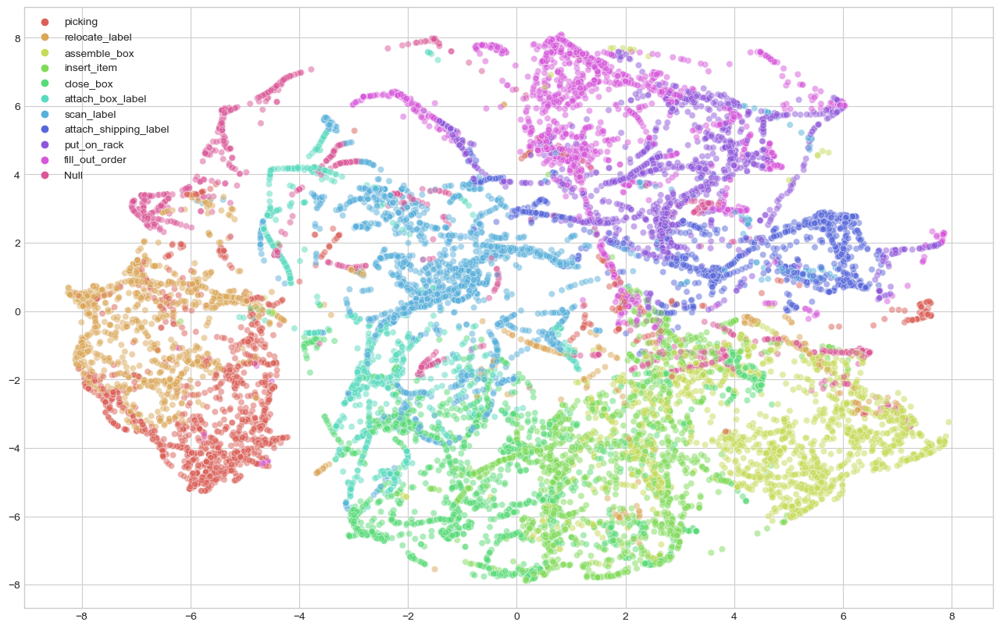

In [197]:
from sklearn.manifold import TSNE
import seaborn as sns
import random

def tsne(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=300)
    tsne_results = tsne.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5
        )

    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['picking','relocate_label','assemble_box','insert_item',
                             'close_box','attach_box_label','scan_label',
                             'attach_shipping_label','put_on_rack','fill_out_order','Null'])
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)


latents = np.load('u0102ssl_latent.npy')
y_true = np.load('u0102ssl_y.npy')

sample_num = 20000
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'u0102_MoILtsne.pdf')

In [147]:
y_true[0]*y_true[1]

(1012, 180, 1)

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 20000 samples in 0.002s...
[t-SNE] Computed neighbors for 20000 samples in 9.371s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20000
[t-SNE] Computed conditional probabilities for sample 2000 / 20000
[t-SNE] Computed conditional probabilities for sample 3000 / 20000
[t-SNE] Computed conditional probabilities for sample 4000 / 20000
[t-SNE] Computed conditional probabilities for sample 5000 / 20000
[t-SNE] Computed conditional probabilities for sample 6000 / 20000
[t-SNE] Computed conditional probabilities for sample 7000 / 20000
[t-SNE] Computed conditional probabilities for sample 8000 / 20000
[t-SNE] Computed conditional probabilities for sample 9000 / 20000
[t-SNE] Computed conditional probabilities for sample 10000 / 20000
[t-SNE] Computed conditional probabilities for sample 11000 / 20000
[t-SNE] Computed conditional probabilities for sample 12000 / 20000
[t-SNE] Computed conditional probabilities for sa

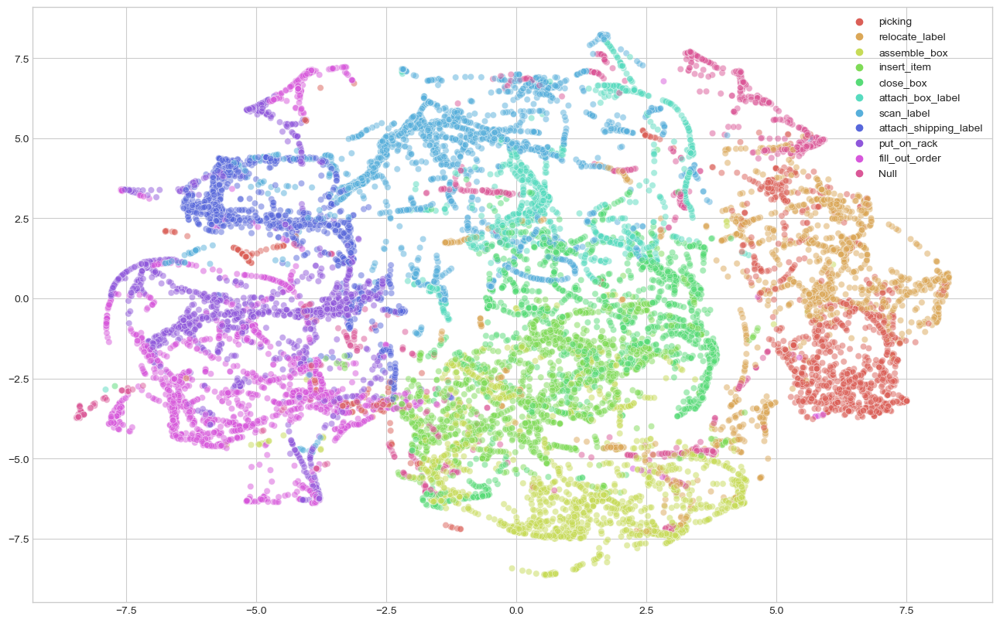

In [198]:
from sklearn.decomposition import PCA
import seaborn as sns

def pca(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    pca = PCA(n_components=2)
    tsne_results = pca.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5
        )

    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['picking','relocate_label','assemble_box','insert_item',
                             'close_box','attach_box_label','scan_label',
                             'attach_shipping_label','put_on_rack','fill_out_order','Null'])
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)

latents = np.load('u0102ssl_latent.npy')
y_true = np.load('u0102ssl_y.npy')
sample_num = 20000
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'u0102_MoILpca.pdf')

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 2.395s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.909322
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.221146
[t-SNE] KL divergence after 500 iterations: 2.185932


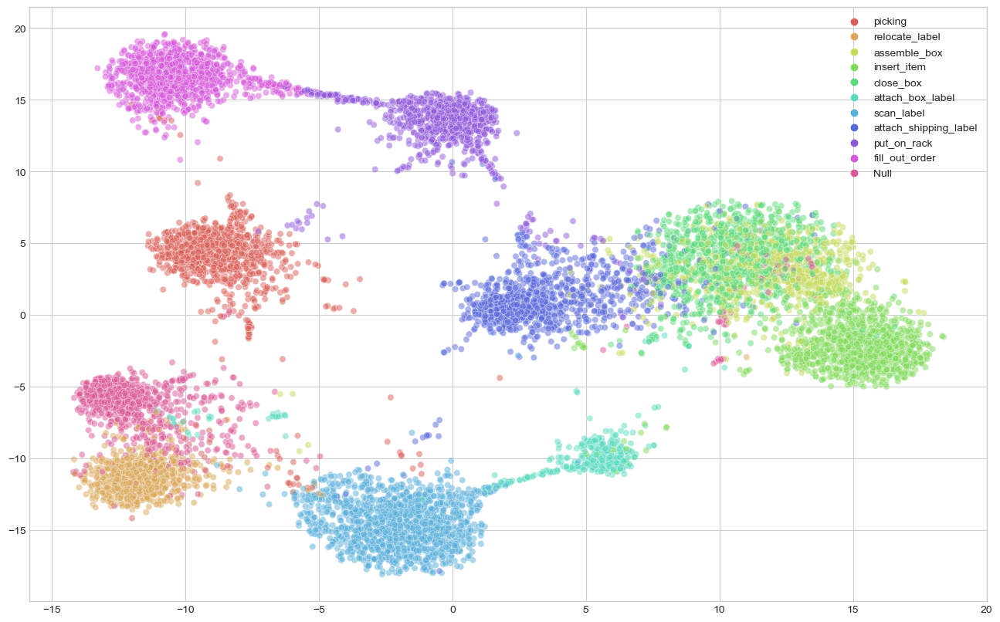

In [199]:
# from sklearn.manifold import TSNE
# import seaborn as sns

def tsne(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=500)
    tsne_results = tsne.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5
        )

    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['picking','relocate_label','assemble_box','insert_item',
                             'close_box','attach_box_label','scan_label',
                             'attach_shipping_label','put_on_rack','fill_out_order','Null'])
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)


latents = np.load('u0102sup_latent.npy')
y_true = np.load('u0102sup_y.npy')
sample_num = 10000
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'u0102_Suptsne.pdf')
# pca(latents.reshape(-1,128)[:10000,:], y_true.reshape(-1)[:10000], 'u0102_Suppca.png')

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 7920 samples in 0.001s...
[t-SNE] Computed neighbors for 7920 samples in 1.467s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7920
[t-SNE] Computed conditional probabilities for sample 2000 / 7920
[t-SNE] Computed conditional probabilities for sample 3000 / 7920
[t-SNE] Computed conditional probabilities for sample 4000 / 7920
[t-SNE] Computed conditional probabilities for sample 5000 / 7920
[t-SNE] Computed conditional probabilities for sample 6000 / 7920
[t-SNE] Computed conditional probabilities for sample 7000 / 7920
[t-SNE] Computed conditional probabilities for sample 7920 / 7920
[t-SNE] Mean sigma: 1.962972
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.858826
[t-SNE] KL divergence after 500 iterations: 2.118547


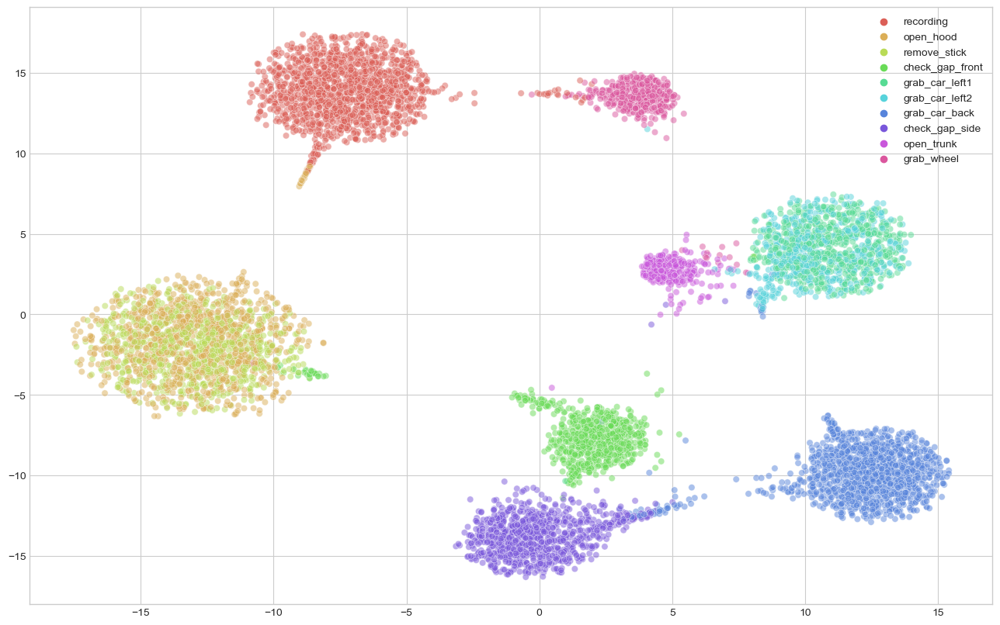

In [200]:
# from sklearn.manifold import TSNE
# import seaborn as sns

def tsne(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=500)
    tsne_results = tsne.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5
        )

    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['recording','open_hood','remove_stick','check_gap_front',
                             'grab_car_left1','grab_car_left2','grab_car_back',
                             'check_gap_side','open_trunk','grab_wheel'])
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)


latents = np.load('u1sup_latent.npy')
y_true = np.load('u1sup_y.npy')
sample_num = min(10000,y_true.shape[0]*y_true.shape[1])
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'u1_Suptsne.pdf')

In [162]:
y_true.shape

(44, 180, 1)

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 1.990s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.106352
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.615044
[t-SNE] KL divergence after 500 iterations: 1.593542


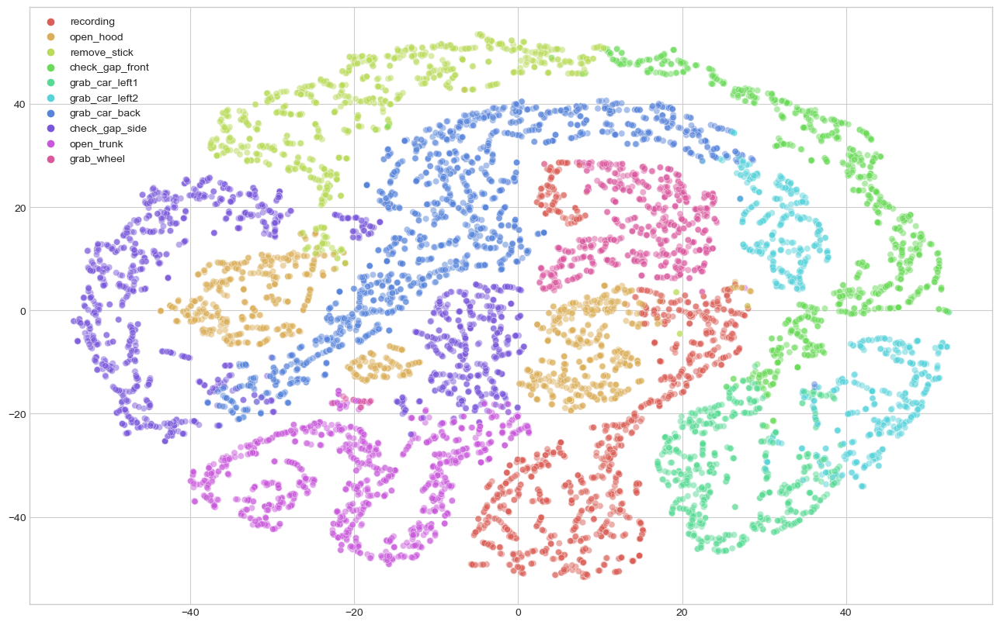

In [201]:
# from sklearn.manifold import TSNE
# import seaborn as sns

def tsne(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    tsne = TSNE(n_components=2, verbose=1, perplexity=10, n_iter=500)
    tsne_results = tsne.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5
        )

    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['recording','open_hood','remove_stick','check_gap_front',
                             'grab_car_left1','grab_car_left2','grab_car_back',
                             'check_gap_side','open_trunk','grab_wheel'])
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)


latents = np.load('u1ssl_latent.npy')
y_true = np.load('u1ssl_y.npy')
sample_num = min(10000,y_true.shape[0]*y_true.shape[1])
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'u1_MoILtsne.pdf')

In [168]:
y_true.shape

(527, 180, 1)

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 9000 samples in 0.001s...
[t-SNE] Computed neighbors for 9000 samples in 1.830s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9000
[t-SNE] Computed conditional probabilities for sample 2000 / 9000
[t-SNE] Computed conditional probabilities for sample 3000 / 9000
[t-SNE] Computed conditional probabilities for sample 4000 / 9000
[t-SNE] Computed conditional probabilities for sample 5000 / 9000
[t-SNE] Computed conditional probabilities for sample 6000 / 9000
[t-SNE] Computed conditional probabilities for sample 7000 / 9000
[t-SNE] Computed conditional probabilities for sample 8000 / 9000
[t-SNE] Computed conditional probabilities for sample 9000 / 9000
[t-SNE] Mean sigma: 0.369895
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.853058
[t-SNE] KL divergence after 500 iterations: 1.568635


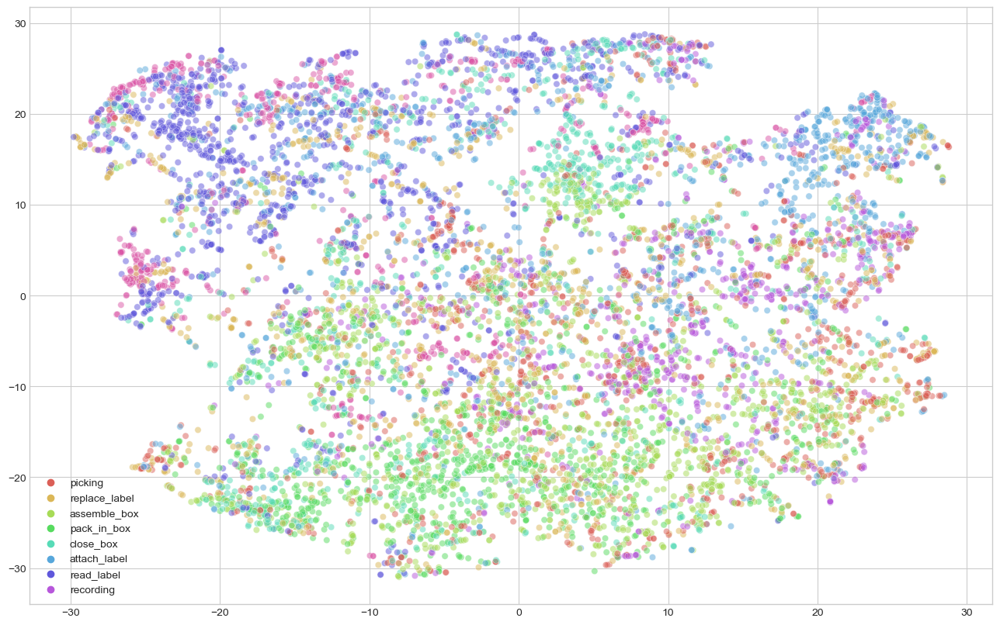

In [202]:
# from sklearn.manifold import TSNE
# import seaborn as sns

def tsne(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=500)
    tsne_results = tsne.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5
        )

    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['picking','replace_label','assemble_box','pack_in_box',
                             'close_box','attach_label','read_label','recording'])
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)


latents = np.load('acc6ssl_latent.npy')
y_true = np.load('acc6ssl_y.npy')
sample_num = 9000
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'acc6ssl_tsne9.pdf')

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 9000 samples in 0.003s...
[t-SNE] Computed neighbors for 9000 samples in 2.456s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9000
[t-SNE] Computed conditional probabilities for sample 2000 / 9000
[t-SNE] Computed conditional probabilities for sample 3000 / 9000
[t-SNE] Computed conditional probabilities for sample 4000 / 9000
[t-SNE] Computed conditional probabilities for sample 5000 / 9000
[t-SNE] Computed conditional probabilities for sample 6000 / 9000
[t-SNE] Computed conditional probabilities for sample 7000 / 9000
[t-SNE] Computed conditional probabilities for sample 8000 / 9000
[t-SNE] Computed conditional probabilities for sample 9000 / 9000
[t-SNE] Mean sigma: 2.075643
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.183052
[t-SNE] KL divergence after 500 iterations: 2.672565


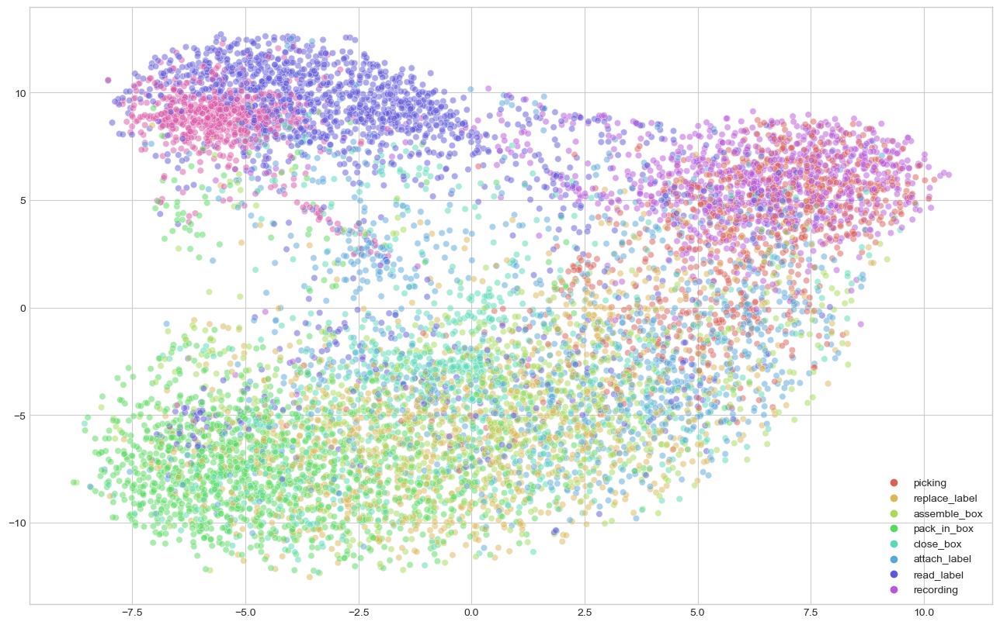

In [203]:
# from sklearn.manifold import TSNE
# import seaborn as sns

def tsne(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    tsne = TSNE(n_components=2, verbose=1, perplexity=100, n_iter=500)
    tsne_results = tsne.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5
        )
    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['picking','replace_label','assemble_box','pack_in_box',
                             'close_box','attach_label','read_label','recording'])
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)


latents = np.load('acc6sup_latent.npy')
y_true = np.load('acc6sup_y.npy')
sample_num = 9000
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'acc6sup_tsne9.pdf')

#### use test data

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...
[t-SNE] Computed neighbors for 5000 samples in 0.730s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.124482
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.955299
[t-SNE] KL divergence after 500 iterations: 0.777380


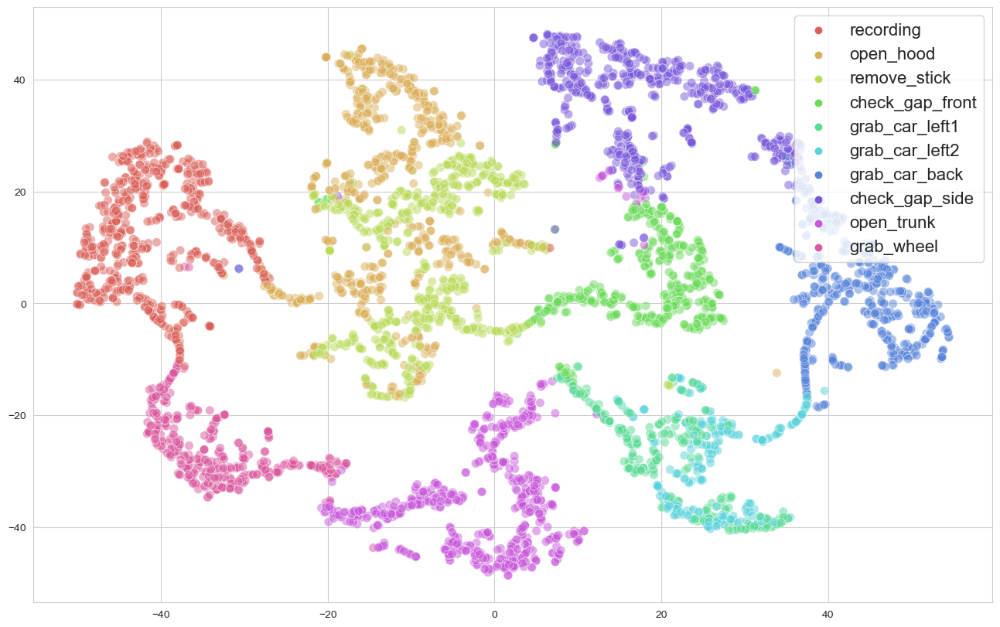

In [26]:
# from sklearn.manifold import TSNE
# import seaborn as sns

def tsne(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=500)
    tsne_results = tsne.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5,
        s=70
        )

    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['recording','open_hood','remove_stick','check_gap_front',
                             'grab_car_left1','grab_car_left2','grab_car_back',
                             'check_gap_side','open_trunk','grab_wheel'],prop={'size':16})
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)


latents = np.load('u1sup_latentT.npy')
y_true = np.load('u1sup_yT.npy')
sample_num = min(5000,y_true.shape[0]*y_true.shape[1])
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'u1_SuptsneT.pdf')

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.001s...
[t-SNE] Computed neighbors for 5000 samples in 0.544s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.187321
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.024891
[t-SNE] KL divergence after 500 iterations: 0.658802


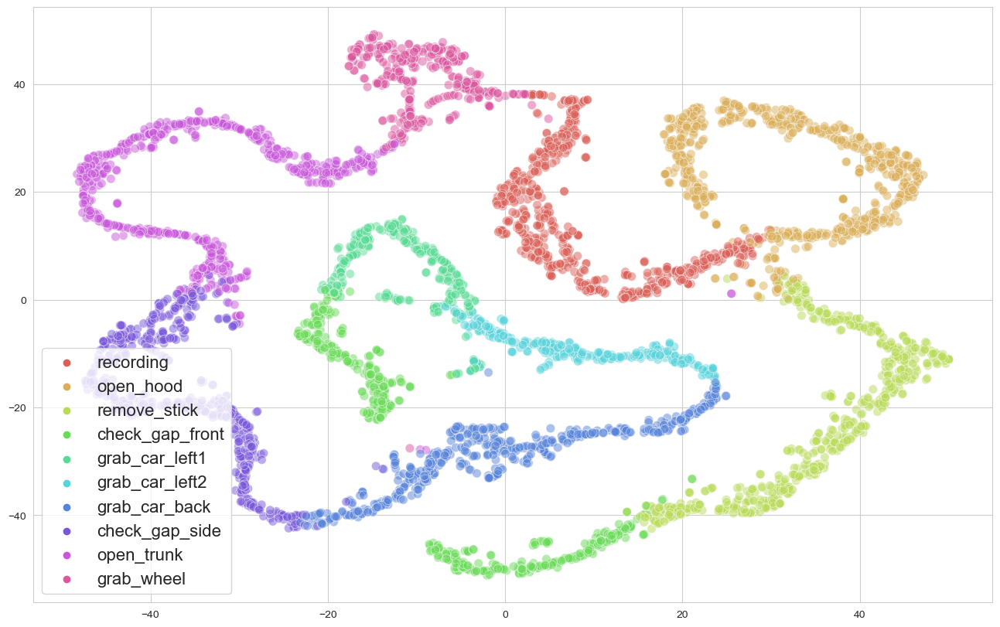

In [28]:
# from sklearn.manifold import TSNE
# import seaborn as sns

def tsne(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=500)
    tsne_results = tsne.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5,
        s=70
        )

    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['recording','open_hood','remove_stick','check_gap_front',
                             'grab_car_left1','grab_car_left2','grab_car_back',
                             'check_gap_side','open_trunk','grab_wheel'],prop={'size':16})
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)


latents = np.load('u1ssl_latentT.npy')
y_true = np.load('u1ssl_yT.npy')
sample_num = min(5000,y_true.shape[0]*y_true.shape[1])
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'u1_SsltsneT.pdf')

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.001s...
[t-SNE] Computed neighbors for 5000 samples in 0.682s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 1.465144
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.829529
[t-SNE] KL divergence after 500 iterations: 1.004490


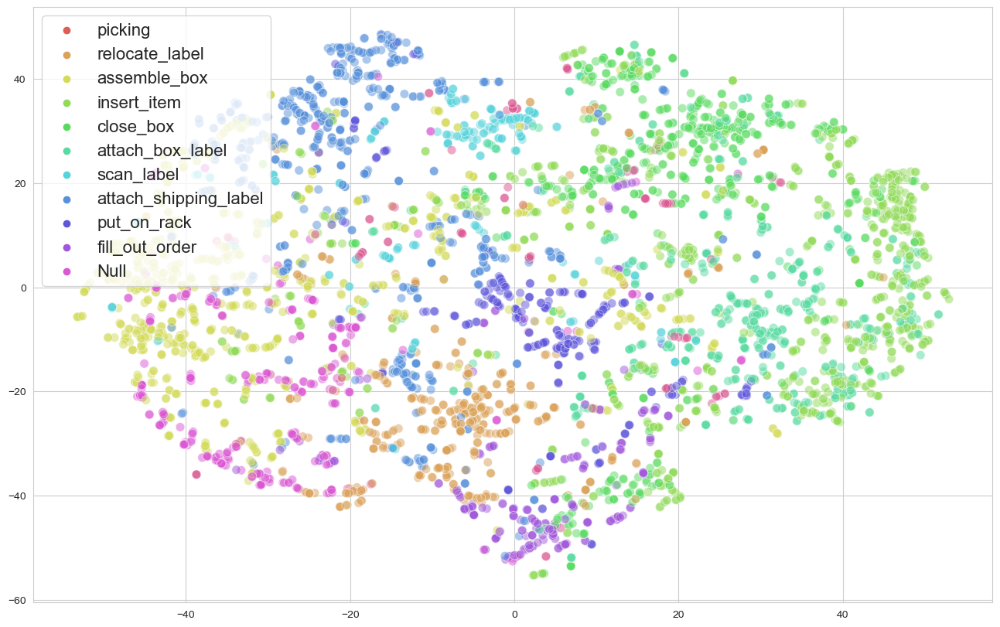

In [21]:
# from sklearn.manifold import TSNE
# import seaborn as sns

def tsne(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=500)
    tsne_results = tsne.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5,
        s=70
        )

    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['picking','relocate_label','assemble_box','insert_item',
                             'close_box','attach_box_label','scan_label',
                             'attach_shipping_label','put_on_rack','fill_out_order','Null'],prop={'size':16},loc='upper left')
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)


latents = np.load('u0102sup_latentT.npy')
y_true = np.load('u0102sup_yT.npy')
sample_num = 5000
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'u0102_SuptsneT.pdf')
# pca(latents.reshape(-1,128)[:10000,:], y_true.reshape(-1)[:10000], 'u0102_Suppca.png')

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.001s...
[t-SNE] Computed neighbors for 5000 samples in 0.611s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 1.351511
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.012657
[t-SNE] KL divergence after 500 iterations: 1.005934


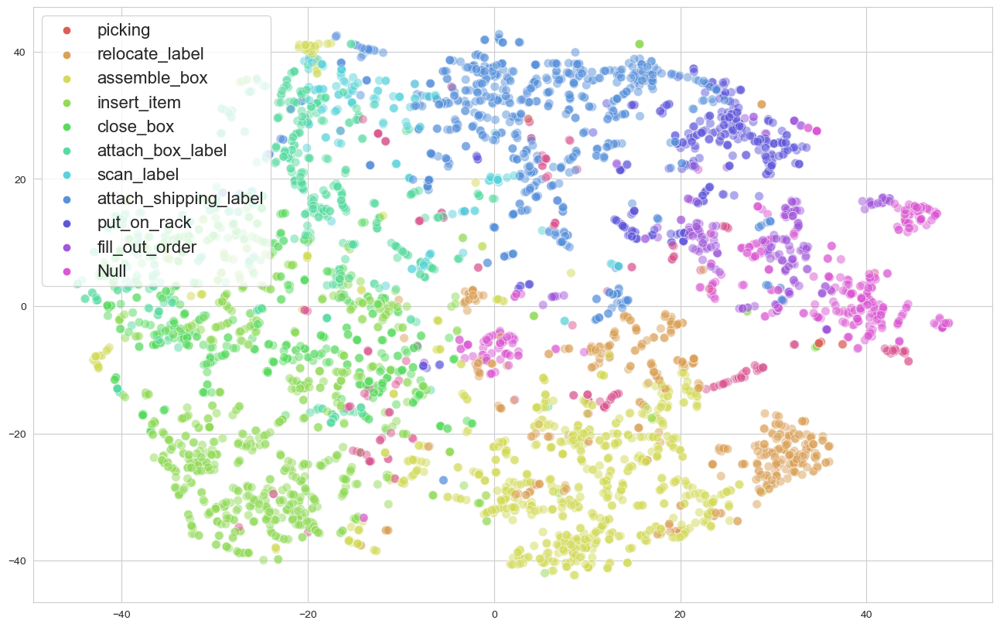

In [31]:
# from sklearn.manifold import TSNE
# import seaborn as sns

def tsne(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=500)
    tsne_results = tsne.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5,
        s=70
        )

    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['picking','relocate_label','assemble_box','insert_item',
                             'close_box','attach_box_label','scan_label',
                             'attach_shipping_label','put_on_rack','fill_out_order','Null'],prop={'size':16},loc='upper left')
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)


latents = np.load('u0102ssl_latentT.npy')
y_true = np.load('u0102ssl_yT.npy')
sample_num = 5000
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'u0102_SsltsneT.pdf')
# pca(latents.reshape(-1,128)[:10000,:], y_true.reshape(-1)[:10000], 'u0102_Suppca.png')

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.001s...
[t-SNE] Computed neighbors for 3000 samples in 0.229s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 1.131551
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.732323
[t-SNE] KL divergence after 500 iterations: 0.960948


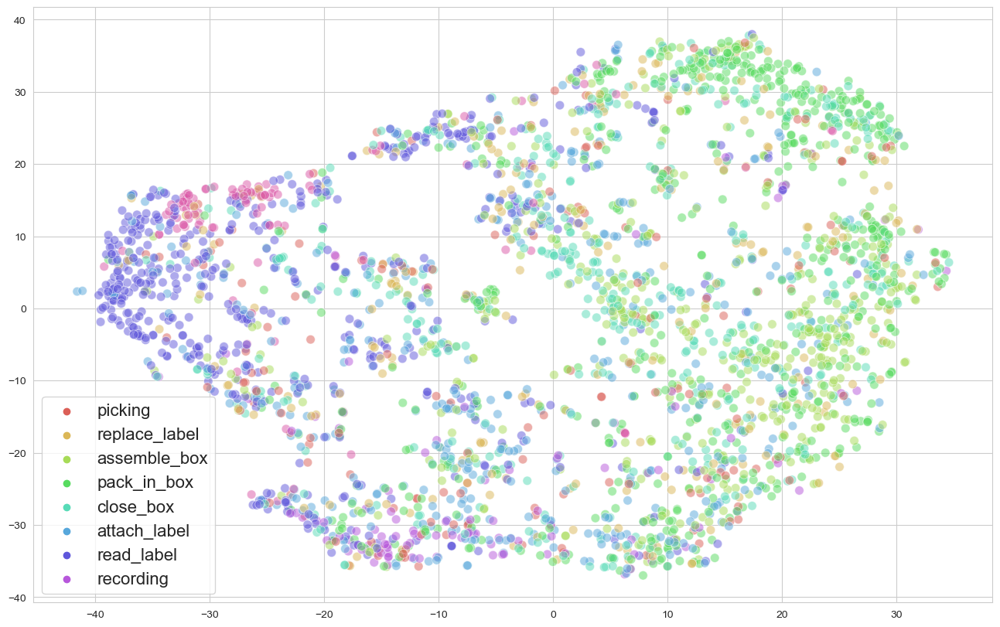

In [32]:
# from sklearn.manifold import TSNE
# import seaborn as sns

def tsne(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=500)
    tsne_results = tsne.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5,
        s=70
        )
    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['picking','replace_label','assemble_box','pack_in_box',
                             'close_box','attach_label','read_label','recording'],prop={'size':16})
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)


latents = np.load('acc6sup_latentT.npy')
y_true = np.load('acc6sup_yT.npy')
sample_num = 3000
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'acc6sup_tsne9T.pdf')

D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
D:\Users\xiqxi\Anaconda3\envs\openpack\lib\site-packages\sklearn\manifold\_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.000s...
[t-SNE] Computed neighbors for 3000 samples in 0.246s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.831010
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.479523
[t-SNE] KL divergence after 500 iterations: 1.278622


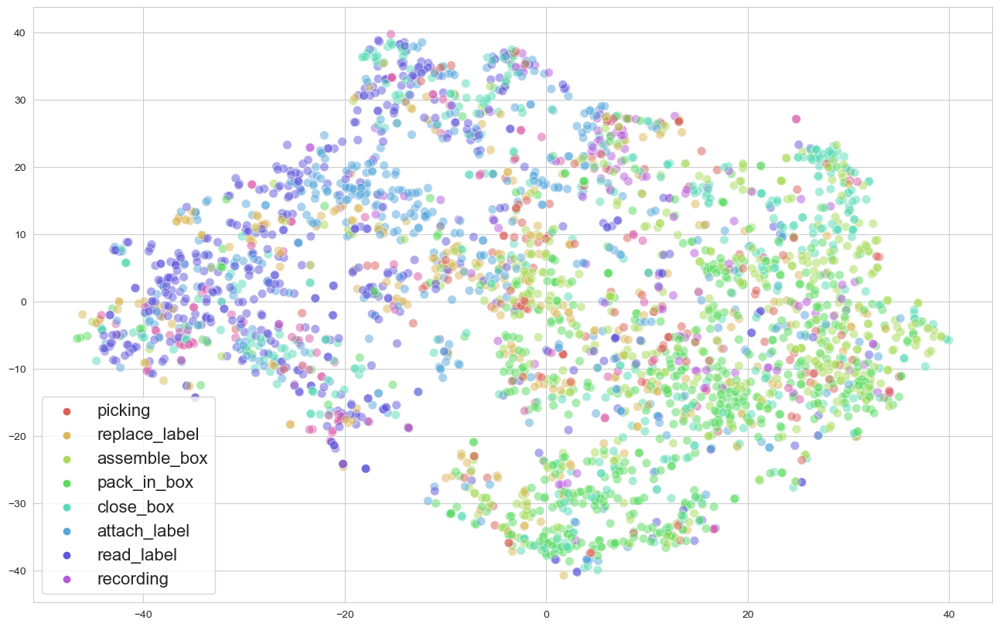

In [36]:
# from sklearn.manifold import TSNE
# import seaborn as sns

def tsne(latent, y_ground_truth, save_dir):
    """
        Plot t-SNE embeddings of the features
    """
    tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=500)
    tsne_results = tsne.fit_transform(latent)
    plt.figure(figsize=(16,10))
    set_y = set(y_ground_truth)
    num_labels = len(set_y)
    sns_plot = sns.scatterplot(
        x=tsne_results[:,0], y=tsne_results[:,1],
        hue=y_ground_truth,
        palette=sns.color_palette("hls", num_labels),
        legend="full",
        alpha = 0.5,
        s=70
        )
    handles, labels  =  sns_plot.get_legend_handles_labels()
    sns_plot.legend(handles,['picking','replace_label','assemble_box','pack_in_box',
                             'close_box','attach_label','read_label','recording'],prop={'size':16})
    sns_plot.get_figure().savefig(save_dir,dpi=600,bbox_inches='tight',pad_inches=0.0)


latents = np.load('acc6ssl_latentT.npy')
y_true = np.load('acc6ssl_yT.npy')
sample_num = 3000
sample_list = [i for i in range(y_true.shape[0]*y_true.shape[1])]
sample_ids = random.sample(sample_list, sample_num)
tsne(latents.reshape(-1,128)[sample_ids,:], y_true.reshape(-1)[sample_ids], 'acc6ssl_tsneT.pdf')

## ubi

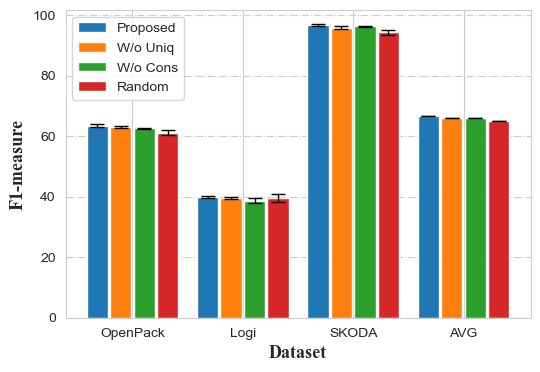

In [56]:

label = ['OpenPack', 'Logi', 'SKODA', 'AVG']
worker = ['Proposed', 'W/o Uniq','W/o Cons', 'Random']

mask5 = [63.51,39.95,96.63,66.70 ]
prop10 = [63.01,39.45,95.88,66.11]
mask20 = [62.60,38.72,96.28,65.87]
mask25 = [61.13,39.42,94.28,64.95]

std_err1 = [0.60,0.40,0.29 ,0]
std_err2 = [0.24 ,0.30,0.60,0]
std_err3 = [0.23,0.80,0.23,0]
std_err0 = [0.76,1.30,0.76,0]

data = [mask5, prop10, mask20, mask25]
stdarray=[std_err1,std_err2,std_err3, std_err0]
plt.figure(figsize=(6,4))
# create_multi_bars_small(worker, label, data, stdarray,group_gap=0.15, bar_gap=0.02)
tick_step = 1
x = np.arange(len(label)) * tick_step
# group_num为数据的组数，即每组柱子的柱子个数
group_num = len(data)
# group_width为每组柱子的总宽度，group_gap 为柱子组与组之间的间隙。
group_gap=0.15
group_width = tick_step - group_gap
# bar_span为每组柱子之间在x轴上的距离，即柱子宽度和间隙的总和
bar_span = group_width / group_num
# bar_width为每个柱子的实际宽度
bar_gap=0.02
bar_width = bar_span - bar_gap

def func(x):
    print(x)
    return
# 绘制柱子
error_params = dict(elinewidth=1,ecolor='black',capsize=5)
for index, v in enumerate(zip(data,stdarray, worker)):
    y, se, l = v
    # sel =

    rects = plt.bar(x + index*bar_span, y, bar_width, yerr=se, error_kw=error_params, label=l)
    # rects.datavalues[0] = 100
    # plt.bar_label(rects, padding=3, rotation='vertical')

plt.ylabel('F1-measure', fontproperties='Times New Roman', size=13,weight='bold')
plt.xlabel('Dataset', fontproperties='Times New Roman', size=13,weight='bold')
plt.legend()
# plt.title('multi datasets')
# ticks为新x轴刻度标签位置，即每组柱子x轴上的中心位置
ticks = x + (group_width - bar_span) / 2
plt.xticks(ticks, label)
plt.grid(axis='y',ls='-.')
plt.savefig('ubiablation.jpg', dpi=600,format='jpg', bbox_inches='tight',pad_inches=0.0)

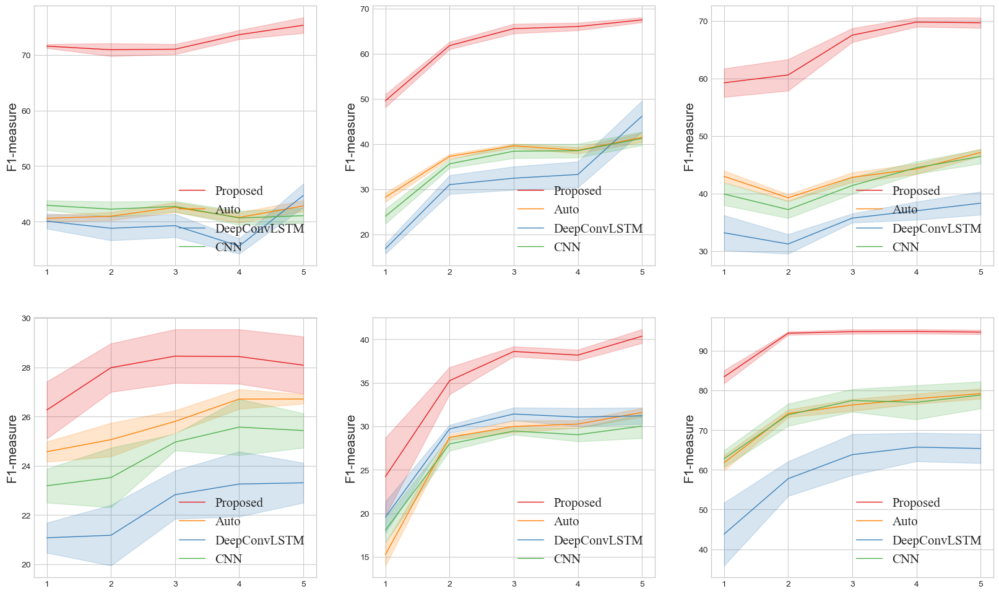

In [61]:
from matplotlib import pyplot
plt.style.use('seaborn-whitegrid')
palette = pyplot.get_cmap('Set1')
font1 = {'family' : 'Times New Roman',
'weight' : 'normal',
'size'   : 15,
}

MoILlist = [
[71.60271192,70.95642288,71.0538798,73.66776322,75.36320187],
[49.59467454,61.80981995,65.56370349,66.03109682,67.5017339],
[59.23922896,60.59803917,67.51835552,69.7763828,69.66414112],
[26.26391341,27.98256382,28.45196908,28.4347157,28.08441032],
[24.2290118,35.24099849,38.6051994,38.185864,40.35811376],
[83.43290548,94.42091337,94.8168876,94.87849481,94.70216666]
]
MoILstd = [
[0.353824039,1.154141766,0.911123659,0.815638279,1.403712064],
[1.454285714,0.813313747,1.058010098,0.835221375,0.539729454],
[2.47233474,2.725765996,1.205923855,0.808835057,0.893518222],
[1.160308,0.98532968,1.08867321,1.105121282,1.164833197],
[4.476408844,1.553899581,0.575774741,0.618342584,0.792376647],
[1.671044261,0.406170433,0.553685575,0.527047057,0.544911337]
]

convlstmlist = [
[40.08993681,38.80965716,39.27911386,35.59552478,44.72162144],
[16.81196549,30.99860632,32.4255488,33.24771,46.1589575],
[33.18253955,31.23447233,35.7354078,37.00976206,38.32272523],
[21.07603584,21.17702472,22.82583832,23.25784262,23.30837075],
[19.5642474,29.69589569,31.41570166,31.06757476,31.21063517],
[43.79556924,57.77647027,63.8275551,65.72176927,65.37528812]
]
convlstmstd = [
[1.35,2.18,2.08,1.37,2.13 ],
[1.12,2.08,2.59,2.86,3.42 ],
[3.04,1.69,0.79,1.58,2.00 ],
[0.61,1.23,0.98,1.32,0.81 ],
[1.80,0.47,0.74,1.04,0.94 ],
[7.92,4.36,5.16,3.57,3.69]
]

cnnlist = [
[42.94,42.25,42.74,40.66,41.08 ],
[24.00,35.61,38.41,38.51,41.23 ],
[39.92,37.21,41.39,44.49,46.44 ],
[23.19,23.52,24.96,25.57,25.43 ],
[18.08,27.98,29.46,29.04,30.03 ],
[62.80,73.86,77.47,77.01,78.85 ]
]
cnnstd = [
[0.88,1.36,0.97,1.25,1.38 ],
[1.65,0.95,1.55,1.52,1.50 ],
[1.94,1.49,1.44,1.07,1.23 ],
[0.69,1.21,0.34,1.14,0.70 ],
[1.40,0.78,0.42,0.77,1.39 ],
[2.11,2.80,2.86,4.29,3.40 ]
]


autolist = [
[40.60,40.98,42.58,40.75,42.83 ],
[28.20,37.25,39.60,38.60,41.47 ],
[42.98,39.27,42.82,44.27,47.13 ],
[24.57,25.06,25.80,26.71,26.71 ],
[15.27,28.74,29.99,30.26,31.60 ],
[61.78,74.22,76.34,77.92,79.20]
]

autostd = [
[0.59,0.74,0.90,0.93,0.99 ],
[1.02,0.51,0.48,0.69,1.04 ],
[1.00,0.59,0.85,0.90,0.63 ],
[0.41,0.68,0.45,0.40,0.19 ],
[1.27,0.31,0.68,0.43,0.51 ],
[1.91,0.95,1.48,1.29,1.27]
]






# 4*4
fig = plt.figure(figsize=(20,12))
# iters=['period1','2','3','4','5']
iters=[1,2,3,4,5]
count = 0
for i in range(3):
    for j in range(1,3,1):
        ax=fig.add_subplot(2,3,count+1)  # 一个图
        #接下来每个图里的线条要分开画。比如moil,conv,...
        color=palette(0)#算法1颜色
        r1 = list(map(lambda x: x[0]-x[1], zip(MoILlist[count],
                                               MoILstd[count])))#上方差
        r2 = list(map(lambda x: x[0]+x[1], zip(MoILlist[count],
                                               MoILstd[count])))#下方差
        ax.plot(iters, MoILlist[count], color=color,label="Proposed",linewidth=1.0)
        ax.fill_between(iters, r1, r2, color=color, alpha=0.2)
        # ax.set_xlabel('Worker A',fontsize=20)

        color=palette(4)
        r1 = list(map(lambda x: x[0]-x[1], zip(autolist[count],
                                               autostd[count])))#上方差
        r2 = list(map(lambda x: x[0]+x[1], zip(autolist[count],
                                               autostd[count])))#下方差
        ax.plot(iters, autolist[count], color=color,label="Auto",linewidth=1.0)
        ax.fill_between(iters, r1, r2, color=color, alpha=0.2)

        # color=palette(6)
        # r1 = list(map(lambda x: x[0]-x[1], zip(unetlist[count],
        #                                        unetstd[count])))#上方差
        # r2 = list(map(lambda x: x[0]+x[1], zip(unetlist[count],
        #                                        unetstd[count])))#下方差
        # ax.plot(iters, unetlist[count], color=color,label="Attention-UNet",linewidth=1.0)
        # ax.fill_between(iters, r1, r2, color=color, alpha=0.2)


        color=palette(1)
        r1 = list(map(lambda x: x[0]-x[1], zip(convlstmlist[count],
                                               convlstmstd[count])))#上方差
        r2 = list(map(lambda x: x[0]+x[1], zip(convlstmlist[count],
                                               convlstmstd[count])))#下方差
        ax.plot(iters, convlstmlist[count], color=color,label="DeepConvLSTM",linewidth=1.0)
        ax.fill_between(iters, r1, r2, color=color, alpha=0.2)
        # ax.set_xlabel('Worker B',fontsize=20)

        color=palette(2)
        r1 = list(map(lambda x: x[0]-x[1], zip(cnnlist[count],
                                               cnnstd[count])))#上方差
        r2 = list(map(lambda x: x[0]+x[1], zip(cnnlist[count],
                                               cnnstd[count])))#下方差
        ax.plot(iters, cnnlist[count], color=color,label="CNN",linewidth=1.0)
        ax.fill_between(iters, r1, r2, color=color, alpha=0.2)
        # ax.set_xlabel('Worker C',fontsize=20)

        count+=1

        ax.legend(loc='lower right',prop=font1)
        ax.set_xticks([1,2,3,4,5])
        ax.set_ylabel('F1-measure',fontsize=15)
        # ax.set_xlabel(,fontsize=15)
        if count>9:
            break
    # break
# plt.show()
plt.savefig('ubisupervise.png', dpi=600,format='png',bbox_inches='tight',pad_inches=0.0)

### data loader

In [ ]:
# skoda
skodapath = r'D:\Code\openpack_box\baselines-SSL\CL-HAR-main\motif_processing\save_motif_scores\skoda\motif_num40_Hamming_u1_2hands.pkl'

a = np.load(skodapath, allow_pickle=True)

In [ ]:
hz = 98
period = 1
durations = 0
sd = []
for i in a[0]:
    duration = i.shape[0]/30
    sd.append(duration)
    print(i.shape)
    durations += duration
    period += 1
    print('the %d th period is %f seconds\n'%(period,duration))
print('sd is %f'%np.std(sd))

# a[0][0].shape

In [ ]:
durations/period

In [ ]:
ulist=['motif_num20_Hamming_U0101_s1_2hands.pkl', 'motif_num20_Hamming_U0102_s1_2hands.pkl',
'motif_num20_Hamming_U0103_s1_2hands.pkl','motif_num20_Hamming_U0105_s1_2hands.pkl',
    'motif_num20_Hamming_U0106_s1_2hands.pkl','motif_num20_Hamming_U0107_s1_2hands.pkl',
    'motif_num20_Hamming_U0109_s1_2hands.pkl','motif_num20_Hamming_U0202_s1_2hands.pkl',
    'motif_num20_Hamming_U0205_s1_2hands.pkl','motif_num20_Hamming_U0210_s1_2hands.pkl',
]
openpath = r'D:\Code\openpack_box\baselines-SSL\CL-HAR-main\motif_processing\save_motif_scores\openpack'

for u in ulist:
    opath = os.path.join(openpath, u)
    a = np.load(opath, allow_pickle=True)
    period = 0
    durations = 0
    sd = []
    for i in a[0]:
        duration = i.shape[0]/30
        sd.append(duration)
        # print(i.shape)
        durations += duration
        period += 1
        # print('the %d th period is %f seconds\n'%(period,duration))
    print(u + ' has %d periods'%period)
    print('avg duration is %f'%(durations/period))
    print('sd is %f'%np.std(sd))
    # break

In [ ]:
durations/59

In [ ]:
# ulist=['motif_num20_Hamming_acc_03_r_Lhand.pkl', 'motif_num20_Hamming_acc_04_r_Lhand.pkl',
# 'motif_num20_Hamming_acc_05_r_Lhand.pkl','motif_num20_Hamming_acc_06_r_Lhand.pkl']
ulist=['motif_num20_Hamming_acc_06_r_Lhand.pkl']
openpath = r'D:\Code\openpack_box\baselines-SSL\CL-HAR-main\motif_processing\save_motif_scores\logi'

for u in ulist:
    opath = os.path.join(openpath, u)
    a = np.load(opath, allow_pickle=True)
    period = 0
    durations = 0
    sd = []
    for i in a[0]:
        duration = i.shape[0]/30
        # print(i.shape)
        sd.append(duration)
        durations += duration
        period += 1
        # print('the %d th period is %f seconds\n'%(period,duration))
    print(u + ' has %d periods'%period)
    print('avg duration is %f'%(durations/period))
    print('sd is %f'%np.std(sd))
    break

In [ ]:
sd